In [2]:
import requests
from bs4 import BeautifulSoup as bs
import json
import re
import numpy as np
import scipy.stats as stats
import scipy.sparse
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

In [14]:
#Get links for each major in the course catalogue
URL = "https://catalog.colorado.edu/courses-a-z/"
page = requests.get(URL)

soup = bs(page.content, "html.parser")
majors = soup.find(id="atozindex")
elements = majors.find_all("ul")

urls = []
course_names = {}

for element in elements:
    link = element.find_all("a")
    for l in link:
        c_name, abbrev = l.text.strip().split(" (")
        course_names[abbrev[:-1]] = c_name
        l_url = l["href"]
        urls.append("https://catalog.colorado.edu"+l_url)

In [15]:
with open("./course_urls.txt", 'w') as f:
    for u in urls:
        f.write("%s\n" % u)

In [16]:
with open("./course_names.json", 'w') as f:
    json.dump(course_names, f) 

In [17]:
#Extract and organize additional information of course
def cleanInfo(cextra):
    info = {}
    for i in cextra.prettify().split('<strong>')[1:]:
        strongsoup = (bs('<strong>' + ''.join(i), features="html.parser"))
        # print(strongsoup, "next")
        header = strongsoup.find('strong').text
        # print(header)
        text = (strongsoup.get_text(strip=True).replace('\n','').replace('\xa0', '').replace('  ', '').replace('\u00a0', ''))
        splits = text.split(':',1)
        info[splits[0]] = splits[1]

        if "Equivalent" in splits[0]:
            equs = re.findall('[A-Z]{4}[0-9]{4}', splits[1])
            info[splits[0]] = equs
            # print(equs)
        elif "Requisites" in splits[0]:
            requs = re.findall('[A-Z]{4}[0-9]{4}', splits[1])
            info[splits[0]] = requs
            # print(requs)
        elif "Recommended" in splits[0]:
            recoms = re.findall('[A-Z]{4}[0-9]{4}', splits[1])
            info[splits[0]] = recoms
        
    return info

#Remove non characters
def cleanText(text):
    return text.replace('\n','').replace('\xa0', '').replace('  ', '').replace('\u00bf','').replace('\u00a0', '')

In [18]:
with open("./course_urls.txt") as f:
    urls = f.read().splitlines()

In [19]:
#Iterate through each course in each program, store information in dictionary
#{ccode: {"title": ctitle, "credits": ccredit, "description": cdesc, "extra": cextra}}
course_info = {}
for url in urls:
    row = []
    page = requests.get(url)
    soup = bs(page.content, "html.parser")
    container = soup.find("div", class_="sc_sccoursedescs")
    try:
        courses = container.find_all("div", class_="courseblock")
    except AttributeError:
        print(url)
        print(soup.prettify())
        print(container.prettify())
    
    for course in courses:
        ccode = course['data-coursecode'].replace(' ','')
        ccredit, ctitle = course.find("p", class_="courseblocktitle noindent").text.split(" (", 1)[1].split(") ", 1)
        # cdesc = course.find("p", class_="courseblockdesc noindent").text.strip()
        cdesc = course.find("p", class_="courseblockdesc noindent").get_text(strip = 'True')
        cextra = course.find("p", class_ = "courseblockextra noindent")
        course_info[ccode] = {"title": ctitle, "credits": ccredit, "description": cleanText(cdesc), "extra": cleanInfo(cextra)}
        # print(ccode, cleanInfo(cextra))

In [20]:
with open("./course_info.json", 'w') as outfile:
    json.dump(course_info, outfile)

In [3]:
with open("./course_info.json", 'r') as infile:
    course_info = json.load(infile)

In [23]:
#Create matrix for directed graph of required/recommended prerequisites -> course, equivalent is bidirectional
namespace = {}
idxtotitle = {}
for i, key in enumerate(course_info.keys()):
    namespace[key] = i
    idxtotitle[i] = key
    
n = len(course_info)
cmat = np.zeros((n,n))
requisites = np.zeros(n)
    
for course in course_info:
    # print(course, end=' ')
    try:
        eqs = course_info[course]["extra"]["Equivalent - Duplicate Degree Credit Not Granted"]
        for e in eqs:
            cmat[namespace[course], namespace[e]] = cmat[namespace[e], namespace[course]] = 1
            requisites[namespace[course]] += 1    
        # print(eqs, end='')
    except:
        pass
    
    try:    
        reqs = course_info[course]["extra"]["Requisites"]
        for r in reqs:
            cmat[namespace[r], namespace[course]] = 1
            requisites[namespace[course]] += 1    
        # print(reqs, end='')
    except:
        pass 
    
    try:    
        recoms = course_info[course]["extra"]["Recommended"]
        for r in recoms:
            cmat[namespace[r], namespace[course]] = 1
            requisites[namespace[course]] += 1
        # print(recoms, end='')    
    except:
        pass 
    # print(requisites[namespace[course]])

In [4]:
#equivalent classes only sum to 1 connection
namespace = {}
idxtotitle = {}
for i, key in enumerate(course_info.keys()):
    namespace[key] = i
    idxtotitle[i] = key
    
n = len(course_info)
cmat = np.zeros((n,n))
requisites = np.zeros(n)
    
for course in course_info:
    # print(course, end=' ')
    try:
        eqs = course_info[course]["extra"]["Equivalent - Duplicate Degree Credit Not Granted"]
        for e in eqs:
            cmat[namespace[course], namespace[e]] = cmat[namespace[e], namespace[course]] = 0.5
            requisites[namespace[course]] += 1    
        # print(eqs, end='')
    except:
        pass
    
    try:    
        reqs = course_info[course]["extra"]["Requisites"]
        for r in reqs:
            cmat[namespace[r], namespace[course]] = 1
            requisites[namespace[course]] += 1    
        # print(reqs, end='')
    except:
        pass 
    
    try:    
        recoms = course_info[course]["extra"]["Recommended"]
        for r in recoms:
            cmat[namespace[r], namespace[course]] = 1
            requisites[namespace[course]] += 1
        # print(recoms, end='')    
    except:
        pass 
    # print(requisites[namespace[course]])
dftemp = pd.DataFrame(cmat, columns=course_info.keys(), index = course_info.keys())
colsum = np.array(dftemp.sum(axis=0))
rowsum = np.array(dftemp.sum(axis=1))
sumsum = colsum+rowsum
print(np.sum(colsum))

8376.5


[1. 1. 1. ... 0. 0. 0.]


Text(0.5, 1.0, 'Classes with Prerequisites ')

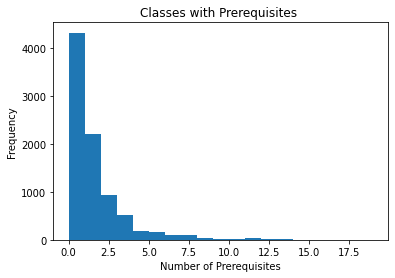

In [10]:
print(requisites)
plt.hist(requisites,  bins=19)
plt.xlabel("Number of Prerequisites")
plt.ylabel("Frequency")
plt.title("Classes with Prerequisites ")

In [11]:
with open("./course_names.json", 'r') as infile:
    course_title = json.load(infile)

22.0


Text(0.5, 1.0, 'Classes in department')

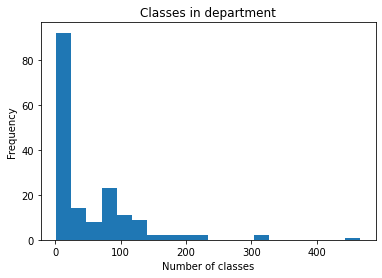

In [22]:
for codes in course_title:
    course_title[codes] = 0

for title in course_info:
    course_title[title[:4]] += 1
    
title_freq = list(course_title.values())
print(np.median(title_freq))

plt.hist(title_freq, bins=20)
plt.xlabel("Number of classes")
plt.ylabel("Frequency")
plt.title("Classes in department")

In [24]:
df = pd.DataFrame(cmat, columns=course_info.keys(), index = course_info.keys())
# df.head()

In [25]:
df.to_pickle('./dffull.pkl') 

In [38]:

len(df)

8680

In [25]:
#Get column/row index where no links exist

colsum = np.array(df.sum(axis=0))
rowsum = np.array(df.sum(axis=1))
sumsum = colsum+rowsum
print(sumsum)
print(np.sum(colsum))

drops = []
for idx, sum in enumerate(sumsum):
    if sum == 0:
        drops.append(idx)
        # print(idxtotitle[idx])
        # df.drop(index = idxtotitle[i], columns=idxtotitle[i])

[7. 4. 6. ... 0. 0. 0.]
10078.0


In [26]:
#Drop empty row/col
dfdrop = df.drop(df.columns[drops], axis=1).drop(df.index[drops], axis=0)
print("most prerequisites needed: " + dfdrop.sum(axis=0).idxmax())
print("most prerequisites applied: " + dfdrop.sum(axis=1).idxmax())
dfdrop.head()


most prerequisites needed: ATLS4889
most prerequisites applied: APPM2360


,ACCT3220,ACCT3225,ACCT3230,ACCT3320,ACCT3440,ACCT3700,ACCT4240,ACCT4250,ACCT4540,ACCT4620,...,WGST5001,WGST5002,WGST5200,WGST5400,WRTG1100,WRTG1150,WRTG2000,WRTG3020,WRTG3030,WRTG3035
ACCT3220,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ACCT3225,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ACCT3230,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ACCT3320,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ACCT3440,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [39]:
print(np.max(dfdrop.sum(axis=0)))

19.0


In [28]:
graphmat = dfdrop.to_numpy()
np.fill_diagonal(graphmat,0)
names = np.array(dfdrop.columns)
print(graphmat)
print(np.shape(names))

[[0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
(4868,)


In [29]:
G=nx.Graph()
neighbors=dict.fromkeys(range(len(graphmat)))

for i in range(len(graphmat)):
    neighbors[i]=np.where(graphmat[:,i])[0]
# print(neighbors)

nodes=[i for i in range(len(graphmat))]
G.add_nodes_from(nodes)
for i in range(len(graphmat)):
    toadd=neighbors[i]
    for j in range(len(toadd)):
        G.add_edge(i,toadd[j])

In [30]:
fig, ax = plt.subplots(figsize=(200, 200))      
# np.random.seed(4022)
pos = nx.spring_layout(G) #algorithm that tries to "cluster" node plot locations; it saves the xy coords of each vertex
nx.draw_networkx_nodes(G, pos, node_size=200, alpha=.3); #node colors easy to see labels over
nx.draw_networkx_edges(G, pos, width=0.8, alpha=0.5, edge_color='blue'); #draw edges, using xy-node layout provided
labels=dict(zip(range(len(graphmat)),names))
nx.draw_networkx_labels(G, pos, labels, font_size=8, font_color='black'); #label vertices by index/number

In [31]:
dfdrop.to_pickle('./dfdrop.pkl') 
#dfdrop = pd.read_pickle(./dfdrop.pkl')

In [32]:
with open('./course_matrix.npy', 'wb') as f:
    np.save(f, cmat)   

In [33]:
with open('./course_matrix.npy', 'rb') as f:
    cmat = np.load(f)   

In [34]:
#HITS algorithm
A = dfdrop.to_numpy()
AT = np.transpose(A)

# hub score:
evals, evecs = np.linalg.eigh(np.matmul(A, AT))
idx_princ = list(evals).index(np.max(evals))
evec_princ = evecs[:,idx_princ]
if evec_princ[0] < 0:
    evec_princ = -evec_princ
hscores = evec_princ/np.max(evec_princ)


# print(zip(hscores.argsort().reverse(), idxtotitle[hscores.argsort().reverse()]))
# authority score:
evals, evecs = np.linalg.eigh(np.matmul(AT, A))
idx_princ = list(evals).index(np.max(evals))
evec_princ = evecs[:,idx_princ]
if evec_princ[0] < 0:
    evec_princ = -evec_princ
ascores = evec_princ/np.max(evec_princ)


In [35]:
#Highest Hub scores and Authority scores
# print(hscores)
hidx = hscores.argsort()[::-1]
hubzip = np.array(list(zip(hscores[hidx], [dfdrop.columns[idx] for idx in hidx])))
print(hubzip[:10])
with open('./hubs.npy', 'wb') as f:
    np.save(f, hubzip)   

aidx = ascores.argsort()[::-1]
autzip = np.array(list(zip(ascores[aidx], [dfdrop.columns[idx] for idx in aidx])))
print(autzip[:10])
with open('./auts.npy', 'wb') as f:
    np.save(f, autzip)  


[['1.0' 'ECON3818']
 ['0.9922622550673653' 'STAT3100']
 ['0.9623132208016921' 'CVEN3227']
 ['0.9591043736299028' 'CSCI3022']
 ['0.9220123308746747' 'MATH3510']
 ['0.9128080714485537' 'CHEN3010']
 ['0.7493406832953701' 'MATH2130']
 ['0.738933418940533' 'STAT4000']
 ['0.7333439434958137' 'STAT4520']
 ['0.6662811876991255' 'APPM3310']]
[['1.0' 'CSCI4802']
 ['0.8898169126101994' 'CSCI4022']
 ['0.8823319829797441' 'CSCI4622']
 ['0.8630867561710792' 'CSCI4889']
 ['0.8630867561710792' 'ATLS4889']
 ['0.8372145665577116' 'CSCI3202']
 ['0.7878115775494944' 'CSCI4200']
 ['0.7468936634152701' 'CSCI5622']
 ['0.7463090124720801' 'ECON4858']
 ['0.7433240194519869' 'ECON4211']]


# Project Check-in
* Clarity of description of data, methods used so far; 2 points. Can largely reuse your work from the proposal.

JSON/Dictionary in form of {"CSCI4022": {"title": "Advanced Data Science", "credits": "3", "description": "Introduces students to advanced tools, methods...", "extra": {"Requisites": ["APPM3310", "CSCI2820", ...], "Additional Information": " Departmental Category: Artificial Intelligence "}}}

Create a matrix that describes the relationships between courses. $a_{ij} = 1$ if course i is a required or recommended prerequisite for course j. $a_{ij} = a_{ji} = 1$ if course i is equivalent to course j. 0 otherwise.

* Ability to load (pieces of) the data set; 2 points

In [36]:
with open("../Project/course_info.json") as infile:
    data = json.load(infile)

print(list(data.items())[-1])

('YIDD2010', {'title': 'Intermediate Yiddish 1', 'credits': '4', 'description': 'Review and continuation of skills begun in the first year:reading, writing, speaking and oral comprehension. Provides an intensive introduction to cultural and literary texts of central and eastern European Jewish culture. Department enforced prerequisite:YIDD1020(minimum grade C-).', 'extra': {'Additional Information': 'Departmental Category: Yiddish'}})


* Some kind of rudimentary models and exploration: plots, a table of means, reporting minima or maxima. 
Something that begins to answer the data science question, but may not yet include a deep model.  (For example, a content-based answer to “what’s the most popular item” may precede a collaborative filtering); 3 points.

ATLS 4889 has the maximum of 19 prerequisites and equivalent classes.

ACCT 4900 has the minimum of 0.

In [37]:
print(idxtotitle[requisites.argmax()], requisites[requisites.argmax()])
print(idxtotitle[requisites.argmin()], requisites[requisites.argmin()])

ATLS4889 19.0
ACCT4900 0.0


* 1-3 sentences describing results of preliminary analysis and their importance in the problem at hand. Must be actual prose, and should also conclude with a brief outline of pending work for the final project; 3 points.

I used the HITS algorithm on the matrix since this is a directed graph to see which courses have the highest number of required class and which class can fulfill a requirement for the highest number of classes. There needs to be some cleaning within the code to eliminate unicode characters. I am also interested in seeing similarities between unlinked courses using TF-IDF.

In [6]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  

In [4]:
#compile course descriptions into one array of documents
descs = [] 
for key in course_info:
    descs.append(course_info[key]["description"])

In [7]:
#run sklean's tfidf vectorizer
vec = TfidfVectorizer(analyzer='word', stop_words='english')
vecdata = vec.fit_transform(descs)
tokens = vec.get_feature_names_out()

dfVec = pd.DataFrame(data=vecdata.toarray(), index=course_info.keys(), columns = tokens)

In [ ]:
dfVec.head()

,00,000,10,100,1000,1002,1003,1010,1020,1030,...,zonin,zoning,zoo,zoology,zoom,zoonoses,zoshi,zuihitsu,zulu,zweig
ACCT3220,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ACCT3225,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ACCT3230,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ACCT3320,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ACCT3440,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [8]:
#course with highest sum of tf idf scores
dfVec.sum(axis=1).sort_values(ascending=False)[:10]

EBIO5050    7.992700
EBIO4050    7.992700
ASEN5067    7.844248
ASEN4067    7.844248
CESR4130    7.834828
MGMT4130    7.834828
HIST3020    7.833303
CSCI5160    7.816558
ORGL5405    7.684880
ECEN5154    7.679192
dtype: float64

In [9]:
def mag(x):
    return np.sqrt(np.sum(x**2))

def cosine_sim(x,y):
    return np.sum(x*y)/(mag(x)*mag(y))

cosine_function = lambda a, b : round(np.inner(a, b)/(np.linalg.norm(a)*np.linalg.norm(b)), 3)

In [10]:
cosmat = cosine_similarity(dfVec)

In [11]:
#eliminate diagonals which are all ones to get closest distances between courses
dfcos = pd.DataFrame(cosmat, columns = course_info.keys(), index = course_info.keys())
dfcos.values[[np.arange(dfcos.shape[0])]*2] = 0
dfcos.head()

C:\Users\johnl\AppData\Local\Temp\ipykernel_11700\331634637.py:3: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  dfcos.values[[np.arange(dfcos.shape[0])]*2] = 0


,ACCT3220,ACCT3225,ACCT3230,ACCT3320,ACCT3440,ACCT3700,ACCT4240,ACCT4250,ACCT4540,ACCT4620,...,WRTG3090,WRTG3400,WRTG3840,WRTG3930,WRTG4910,WRTG5050,WRTG5840,YIDD1010,YIDD1020,YIDD2010
ACCT3220,0.000000,0.818607,0.275323,0.171813,0.000000,0.256910,0.506091,0.203614,0.301246,0.083948,...,0.010576,0.006133,0.0,0.029860,0.010463,0.051142,0.0,0.032741,0.0,0.000000
ACCT3225,0.818607,0.000000,0.428663,0.166670,0.000000,0.229150,0.470865,0.197499,0.224990,0.082770,...,0.007899,0.004581,0.0,0.022302,0.024959,0.038196,0.0,0.024453,0.0,0.000000
ACCT3230,0.275323,0.428663,0.000000,0.076468,0.000000,0.074321,0.185208,0.090581,0.000000,0.040024,...,0.015750,0.009134,0.0,0.000000,0.000000,0.029009,0.0,0.000000,0.0,0.000000
ACCT3320,0.171813,0.166670,0.076468,0.000000,0.009882,0.118315,0.202735,0.112759,0.132764,0.097162,...,0.000000,0.000000,0.0,0.011493,0.011625,0.000000,0.0,0.034653,0.0,0.014079
ACCT3440,0.000000,0.000000,0.000000,0.009882,0.000000,0.000000,0.000000,0.000000,0.009461,0.000000,...,0.014325,0.000000,0.0,0.008065,0.008158,0.026384,0.0,0.000000,0.0,0.009880


In [12]:
#courses with highest cumulative similarity
dfcos.sum(axis=0).sort_values(ascending=False)[:10]

EDUC8103    286.844012
MCDB3000    268.399190
ATLS7500    260.359746
MDST1001    258.162785
INFO5651    256.311101
INFO4651    256.311101
ATLS4000    255.934840
ENGL3830    255.348851
FYSM1000    249.270290
GEEN4400    248.896123
dtype: float64

In [ ]:
nearest = {}
# print(dfcos.idxmax())
dfcos.mean().idxmax()

'EDUC8103'